In [3]:
!pip install -q presidio_image_redactor
!python -m spacy download en_core_web_lg

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.6/64.6 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 301.4/301.4 kB 13.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.9/114.9 kB 10.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 59.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.1/58.1 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.1/13.1 MB 64.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 198.9/198.9 kB 17.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.4/85.4 kB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 84.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.9/104.9 kB 9.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.7/400.7 MB 4.4 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_lg')
⚠ Restart to reload depen

In [1]:
!sudo apt install tesseract-ocr
!sudo apt install libtesseract-dev

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 29 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 1s (4,718 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debc

In [2]:
import inspect
from presidio_image_redactor import DicomImagePiiVerifyEngine

file_path = inspect.getfile(DicomImagePiiVerifyEngine)
file_path

'/usr/local/lib/python3.11/dist-packages/presidio_image_redactor/dicom_image_pii_verify_engine.py'

In [3]:
!rm -rf {file_path}
!cp ./dicom_image_pii_verify_engine.py /usr/local/lib/python3.11/dist-packages/presidio_image_redactor/

In [4]:
# RESTART SESSION!!!!

In [1]:
def calculate_precision(gt, pred):
    tp = [i for i in pred if i in gt]
    try:
        precision = len(tp) / len(pred)
    except ZeroDivisionError:
        precision = 0

    return precision

def calculate_recall(gt, pred):
    tp = [i for i in pred if i in gt]
    try:
        recall = len(tp) / len(gt)
    except ZeroDivisionError:
        recall = 0

    return recall

In [2]:
import json

import glob
import os
import time
import pydicom
from pathlib import Path
import matplotlib.pyplot as plt
from PIL import Image
from presidio_image_redactor import DicomImageRedactorEngine
from presidio_image_redactor import DicomImagePiiVerifyEngine

dicom_engine = DicomImageRedactorEngine()
dicom_image_engine = DicomImagePiiVerifyEngine()

In [3]:
!python prepare_data.py

In [4]:
input_path = "./dicom_files/"
output_parent_dir = "./presidio_result/"

start = time.time()

dicom_engine.redact_from_directory(
    input_dicom_path = input_path,
    output_dir = output_parent_dir,
    fill="contrast",
    save_bboxes=True
)

time_taken = round(time.time() - start, 2)

Output written to presidio_result/dicom_files


In [5]:
# Original DICOM images
p = Path(input_path).glob("**/*.dcm")
original_files = [x for x in p if x.is_file()]
print(f"Total Original Files {len(original_files)}")

# Redacted DICOM images
p = Path(output_parent_dir).glob("**/*.dcm")
redacted_files = [x for x in p if x.is_file()]
print(f"Total Redacted Files {len(redacted_files)}")

Total Original Files 15
Total Redacted Files 15


In [6]:
print(f"Time Taken : {round(time_taken, 2)}")
print(f"Average Time Taken : {round( time_taken / len(redacted_files), 2)}")

Time Taken : 8.09
Average Time Taken : 0.54


In [7]:
# Set paths
data_dir = "./dicom_files/"
gt_path = "./gt_main.json"

with open(gt_path) as json_file:
    gt = json.load(json_file)

# Get list of files
gt_dicom_files = list(gt.keys())

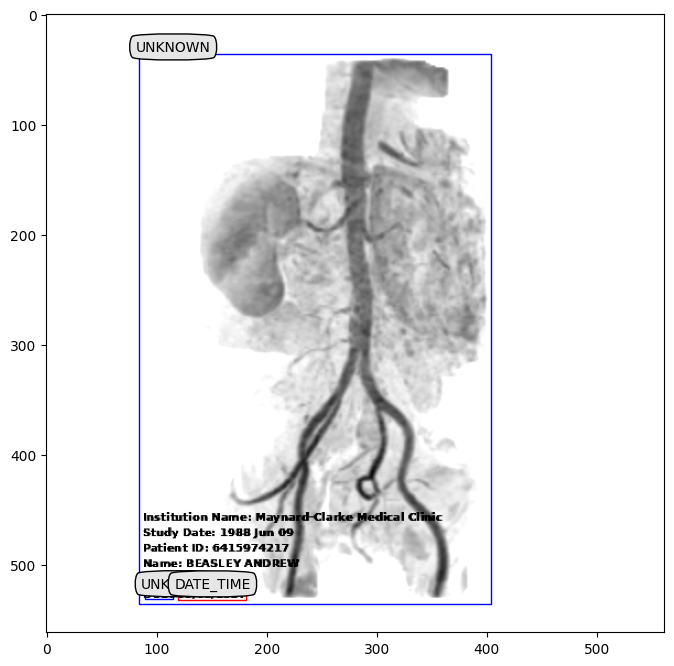

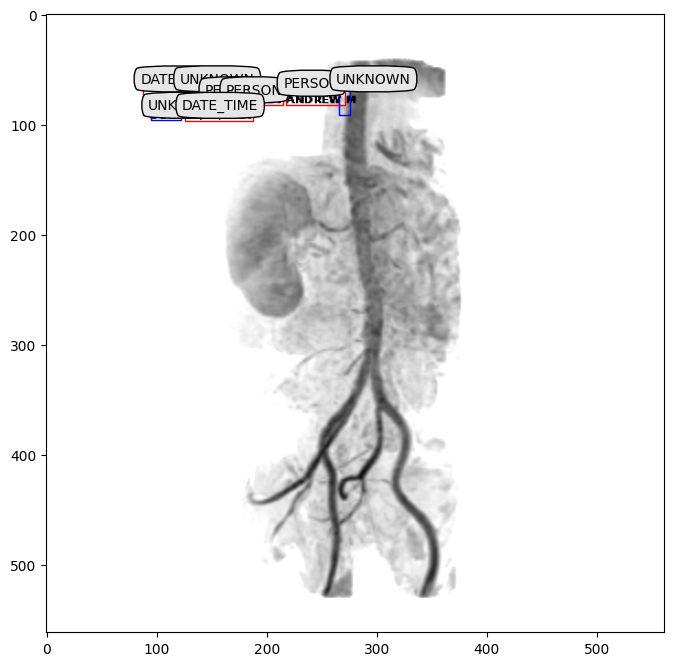

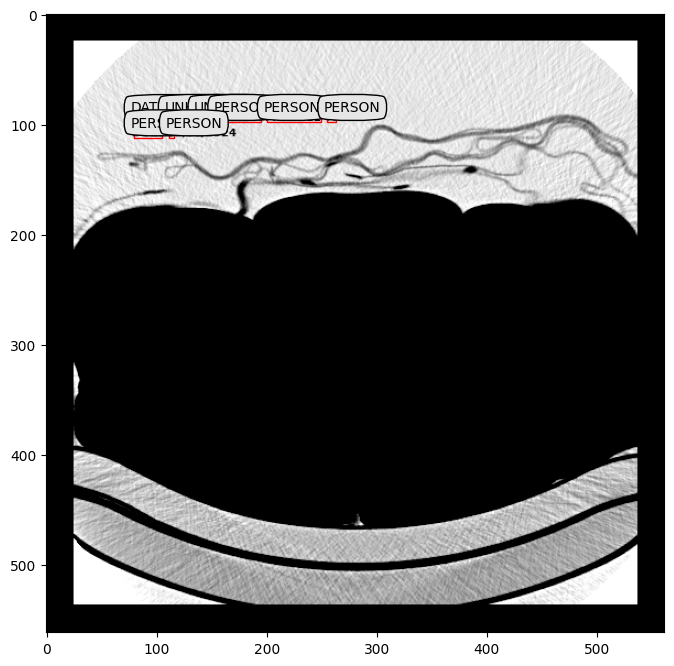

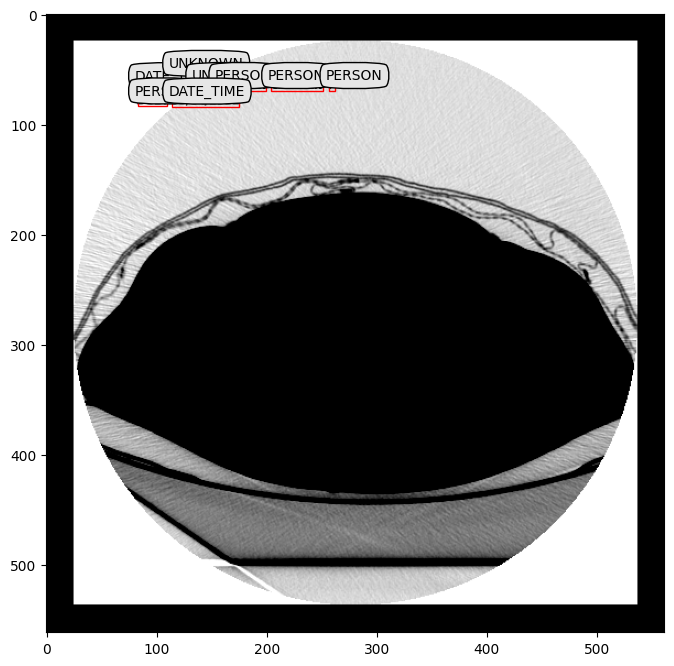

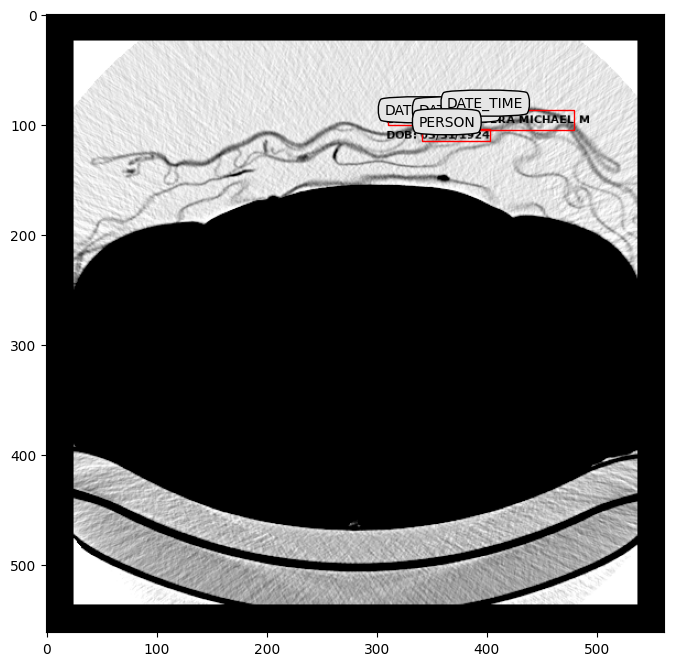

...

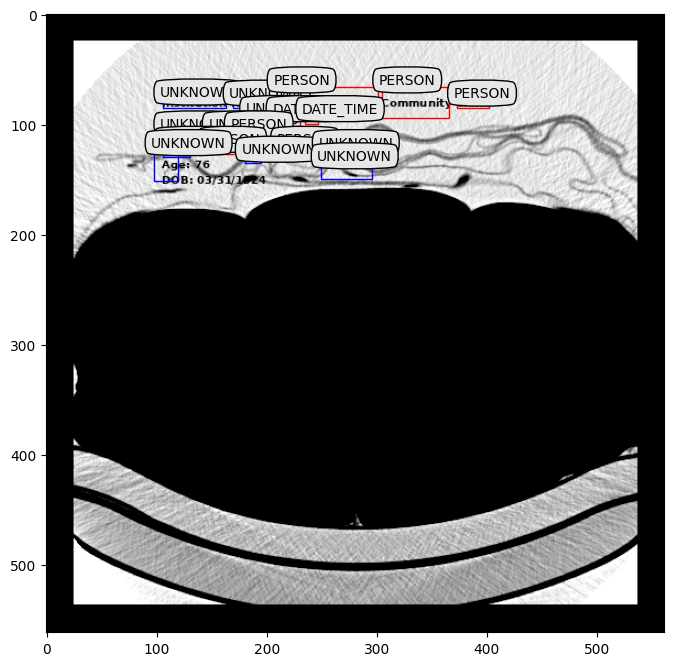

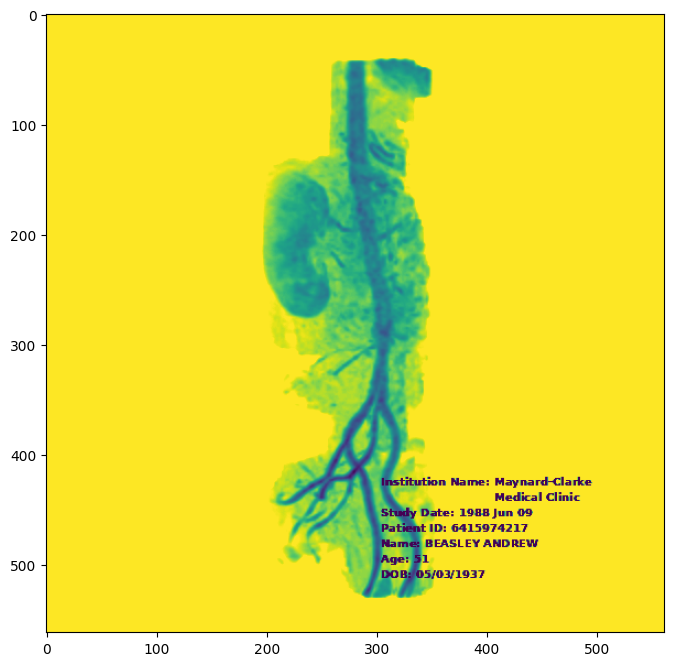

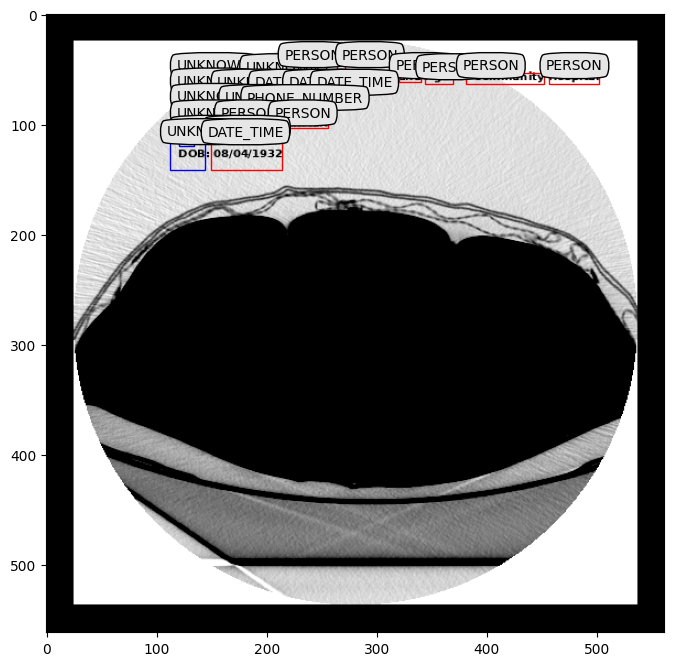

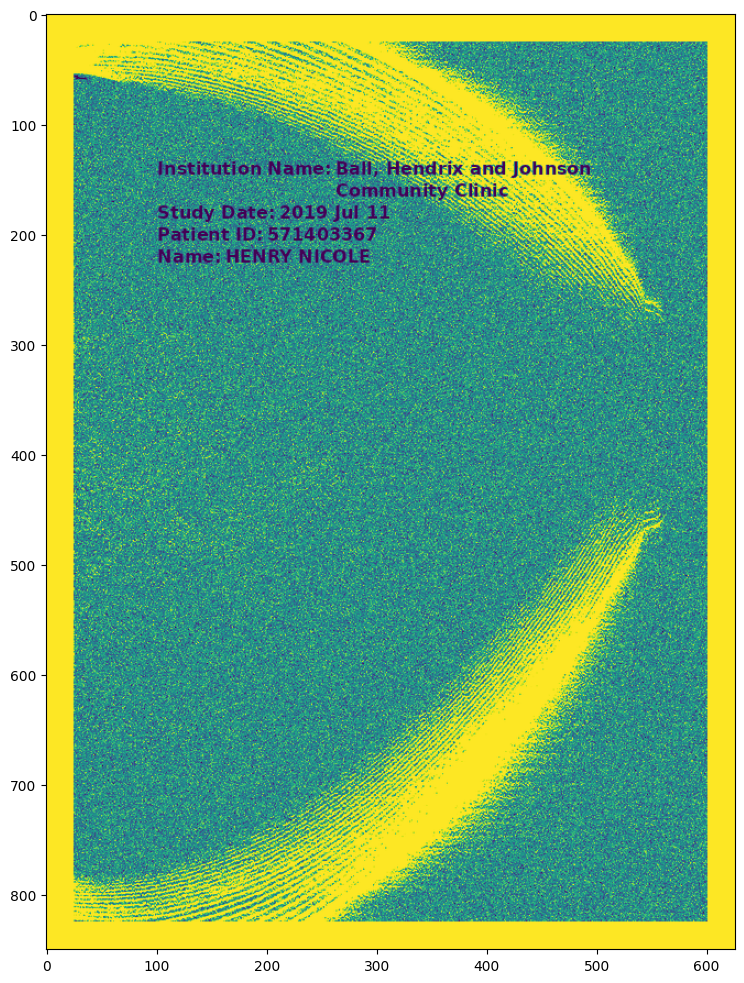

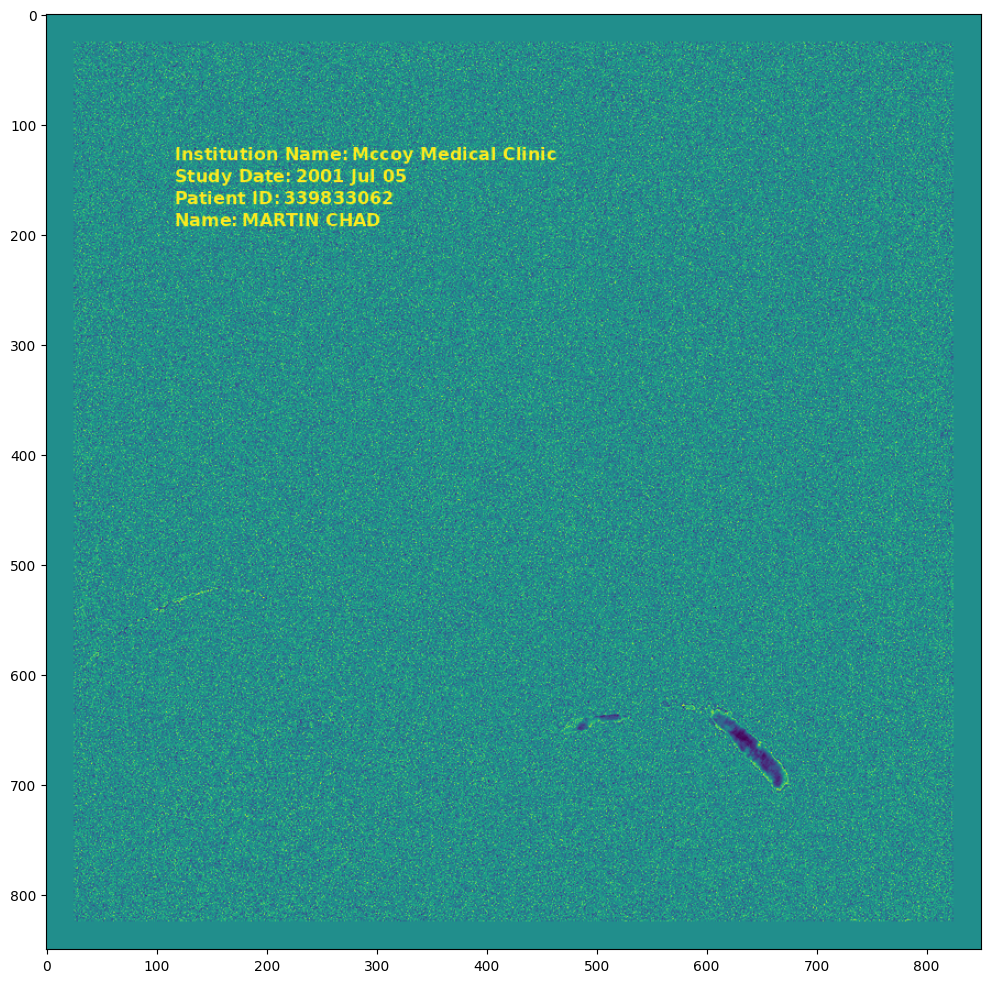

In [8]:
collect_eval_results = {}

for item in gt_dicom_files:
    gt_file_of_interest = gt[item]

    instance = pydicom.dcmread(os.path.join(data_dir, item))

    verify_image, ocr_results, analyzer_results = dicom_image_engine.verify_dicom_instance(instance)
    _, eval_results = dicom_image_engine.eval_dicom_instance(instance, gt_file_of_interest, use_metadata=True)

    collect_eval_results[item] = eval_results

In [9]:
total_precision = 0.0
total_recall = 0.0

collect_results = {}

for key, val in collect_eval_results.items():
  presidio_pred = [i["label"].strip().lower() for i in val["all_positives"]]
  gt_pred = [i["label"].strip().lower() for i in val["ground_truth"]]

  precision = calculate_precision(gt_pred, presidio_pred)
  recall = calculate_recall(gt_pred, presidio_pred)

  collect_results[key] = {"gt" : gt_pred, "pred" : presidio_pred, "precision" : precision, "recall" : recall}

  total_precision += precision
  total_recall += recall

final_precision = round(total_precision / len(collect_eval_results), 2)
final_recall = round(total_recall / len(collect_eval_results), 2)
f1_score = 2 * ((final_precision * final_recall) / (final_precision + final_recall))

print(f"Precision : {final_precision}")
print(f"Recall : {final_recall}")
print(f"F1-Score : {f1_score}")

Precision : 0.09
Recall : 0.13
F1-Score : 0.10636363636363637


In [10]:
with open("./presidio_result.json", "w") as file_out:
  json.dump(collect_results, file_out, indent=4)

In [11]:
os.makedirs("./image_result", exist_ok=True)
os.makedirs("./image_result/presidio/", exist_ok=True)

In [15]:
presidio_dicom_result = glob.glob("./presidio_result/dicom_files/*.dcm")

for dicom_file in presidio_dicom_result:
    base_name = os.path.basename(dicom_file).replace(".dcm", ".jpg")
    ds = pydicom.dcmread(dicom_file)

    image = Image.fromarray(ds.pixel_array).convert("L")

    file_out = os.path.join("./image_result/presidio/", base_name)
    image.save(file_out)